# COVID-19 in Illinois

In [1]:
import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style
from fbprophet import Prophet

import process_data

%config InlineBackend.figure_format = 'retina'

## Update and Process Illinois Data

In [2]:
process_data.get_latest_data()
il_df, off_balance = process_data.get_cleaned_data()

/Users/dave/Projects/covid19/notebooks/process_data.py:122: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [3]:
print(f"Illinois Totals through: {il_df['date'].max().date()}\n")
print(il_df.loc[il_df['county'] == 'Illinois', ['date', 'confirmed_cases', 'deaths']]
      .sort_values('date').set_index('date'))

Illinois Totals through: 2020-04-08

            confirmed_cases  deaths
date                               
2020-03-17            160.0     0.0
2020-03-18            288.0     1.0
2020-03-19            422.0     3.0
2020-03-20            585.0     5.0
2020-03-21            753.0     6.0
2020-03-22           1049.0     9.0
2020-03-23           1285.0    12.0
2020-03-24           1535.0    16.0
2020-03-25           1865.0    19.0
2020-03-26           2538.0    26.0
2020-03-27           3026.0    34.0
2020-03-28           3491.0    47.0
2020-03-29           4596.0    65.0
2020-03-30           5057.0    73.0
2020-03-31           5994.0    99.0
2020-04-01           6980.0   141.0
2020-04-02           7695.0   157.0
2020-04-03           8904.0   210.0
2020-04-04          10357.0   243.0
2020-04-05          11256.0   274.0
2020-04-06          12262.0   307.0
2020-04-07          13549.0   380.0
2020-04-08          15078.0   462.0


In [5]:
# check difference between state and individual counties
# total_tested appears to be reported at only a state level, other differences are negligable
# `off_balance` added to Chicago results since that is the largest breakout
print('Difference between State and County Totals\n')
print(off_balance)

Difference between State and County Totals

            confirmed_cases  deaths
date                               
2020-03-17              0.0    -1.0
2020-03-18             16.0     0.0
2020-03-19              6.0     0.0
2020-03-20              4.0    -1.0
2020-03-21              5.0     0.0
2020-03-22              3.0     0.0
2020-03-23             64.0     0.0
2020-03-24              0.0     0.0
2020-03-25              0.0     0.0
2020-03-26              0.0     0.0
2020-03-27             -1.0     0.0
2020-03-28              5.0     0.0
2020-03-29              9.0     0.0
2020-03-30              8.0     0.0
2020-03-31             17.0     0.0
2020-04-01             26.0     0.0
2020-04-02             37.0     1.0
2020-04-03            415.0     1.0
2020-04-04              0.0     0.0
2020-04-05              0.0     0.0
2020-04-06              0.0     0.0
2020-04-07             -4.0     0.0
2020-04-08             10.0     0.0


## Analysis

In [6]:
# group counties into:
# Chicago, Suburban Cook, Cook Adjacent, and Rest of State
def county_group(county):
    if county in ['Chicago', 'Suburban Cook']:
        return county
    elif county in ['DuPage', 'Lake', 'Will', 'Kane', 'McHenry']:
        return 'Cook Adjacent'
    else:
        return 'Rest of State'
    
summary_df = il_df.copy().query("county != 'Illinois'")
summary_df['group'] = summary_df.county.apply(county_group)

summary_df = (summary_df
              .drop(['negative','total_tested'], axis=1)
              .groupby(['group', 'date'])
              .sum())

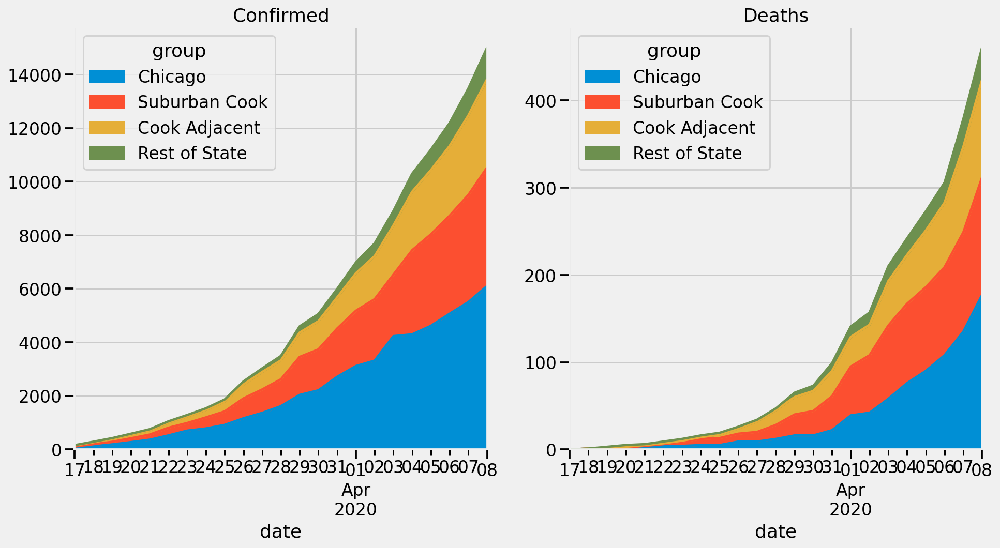

In [7]:
style.use('fivethirtyeight')
sns.set_context('talk')

fig, axs = plt.subplots(1,2, figsize=(14,7))

county_groups = ['Chicago', 'Suburban Cook', 'Cook Adjacent', 'Rest of State']

cumm_df = (
    summary_df
    .reset_index()
    .pivot(index='date',columns='group', values=['confirmed_cases','deaths'])
    .clip(lower=0)
    .reindex(columns=county_groups, level='group'))

cumm_df.plot.area(y='confirmed_cases', title='Confirmed', ax=axs[0]);
cumm_df.plot.area(y='deaths', title='Deaths', ax=axs[1]);

In [8]:
summary_df['confirmed_freq'] = summary_df['confirmed_cases'] / summary_df['pop'] * 10**3
summary_df['deaths_freq'] = summary_df['deaths'] / summary_df['pop'] * 10**3

(summary_df
 .query("date == date.max()")
 .reset_index()
 .drop(['date'], axis=1)
 .set_index('group')
 .reindex(index=county_groups))

,index,confirmed_cases,deaths,pop,confirmed_freq,deaths_freq
group,,,,,,
Chicago,2373,6102.0,177.0,2562913,2.380885,0.069062
Suburban Cook,2396,4428.0,135.0,3144919,1.407985,0.042926
Cook Adjacent,5387,3306.0,112.0,3776692,0.875369,0.029656
Rest of State,103200,1178.0,37.0,4831963,0.243793,0.007657


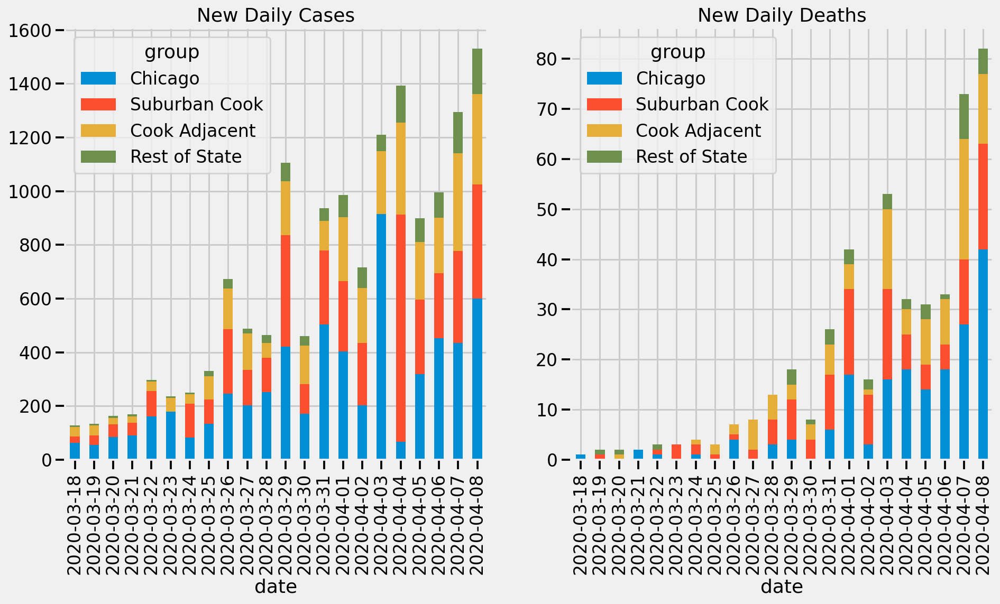

In [9]:
style.use('fivethirtyeight')
sns.set_context('talk')

incr_df = (
    summary_df
    #.query("date > '2020-03-21'")
    .reset_index()
    .pivot(index='date',columns='group', values=['confirmed_cases','deaths'])
    .diff()
    .query("date != date.min()")
    .clip(lower=0)
    .reindex(columns=county_groups, level='group'))

fig, axs = plt.subplots(1,2, figsize=(14,7))

incr_df.plot.bar(y='confirmed_cases', 
                 stacked=True, 
                 title='New Daily Cases', ax=axs[0]);

axs[0].xaxis.set_ticklabels(incr_df.index.to_period('D'));

incr_df.plot.bar(y='deaths',
                 stacked=True, 
                 title='New Daily Deaths', ax=axs[1]);

axs[1].xaxis.set_ticklabels(incr_df.index.to_period('D'));

## Confirmed Case Projections

In [10]:
hist_cases = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/archived_data/archived_time_series/time_series_19-covid-Confirmed_archived_0325.csv')
hist_cases = (hist_cases[hist_cases['Province/State'].apply(lambda x: x in ['Kane, IL', 'Cook County, IL', 'McHenry, IL', 'Lake, IL', 'Illinois'])]
              .drop(['Province/State','Country/Region','Lat','Long'],axis=1)
              .sum()
              .reset_index())
hist_cases.columns = ['ds','y']
hist_cases['ds'] = pd.to_datetime(hist_cases['ds'])
first_case_date = hist_cases.query('y > 0').ds.min()
hist_cases = hist_cases.query(f"ds >= '{first_case_date}' and ds < '2020-03-17'")

In [11]:
new_cases = (
    summary_df
    .groupby('date')
    .agg({'confirmed_cases': 'sum'})
    .reset_index())

new_cases.columns = ['ds','y']
new_cases['y'] = new_cases['y'].astype(np.float64)

INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


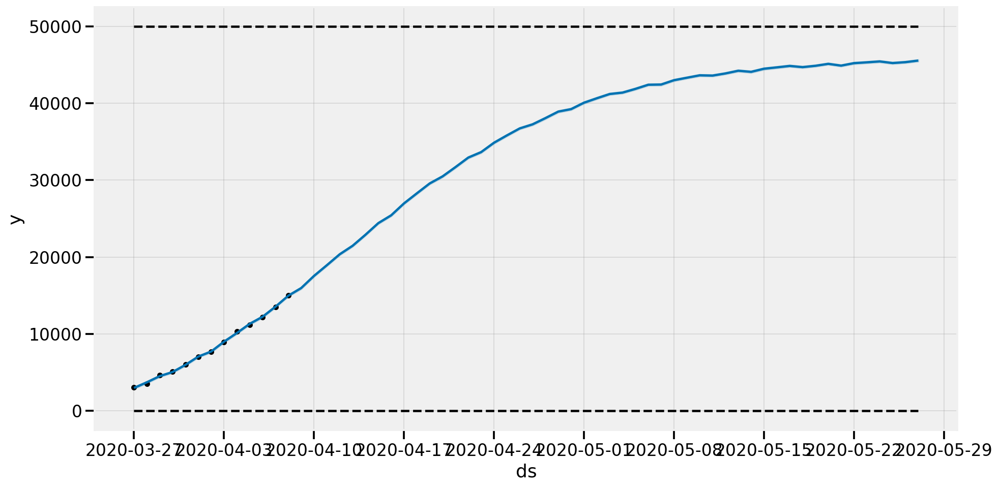

In [12]:
latest_date = new_cases.ds.max()
earliest_date = latest_date - datetime.timedelta(days=12) # predict based on latest 2 weeks

all_cases = pd.concat([hist_cases, new_cases], ignore_index=True)
modeled_cases = all_cases.query(f"ds >= '{earliest_date}'") #" and ds <'{latest_date}'")

ts = modeled_cases.copy()
#ts['y'] = np.log1p(ts['y'])
ts['cap'] = 50000
ts['floor'] = 0

m = Prophet(yearly_seasonality=False, 
            daily_seasonality=False, 
            weekly_seasonality=False, 
            growth='logistic',
            #seasonality_mode='multiplicative',
    ).add_seasonality(
        name="weekly",
        period=7,
        fourier_order=20,
    )
m.fit(ts);

# project next 3 days                     
future = m.make_future_dataframe(49)
future['cap'] = 50000
future['floor'] = 0
forecast = m.predict(future)
m.plot(forecast, figsize=(14,7));
# forecast2 = forecast[['yhat_lower', 'yhat', 'yhat_upper']] #.apply(np.expm1)
# forecast2['ds'] = forecast['ds']

# ax = plt.subplots(figsize=(12,6))

# # projected confirmed cases
# sns.set_style('whitegrid')

# plt.plot(modeled_cases.ds.values, modeled_cases.y, 'or')
# plt.plot(forecast2.ds.values, forecast2.yhat.values, color='gray');
# plt.fill_between(forecast2.ds.values, 
#                  forecast2.yhat_lower.values, 
#                  forecast2.yhat_upper.values, 
#                  color='gray', alpha=0.2);
# plt.title('Illinois Confirmed Cases', {'fontsize': 20});

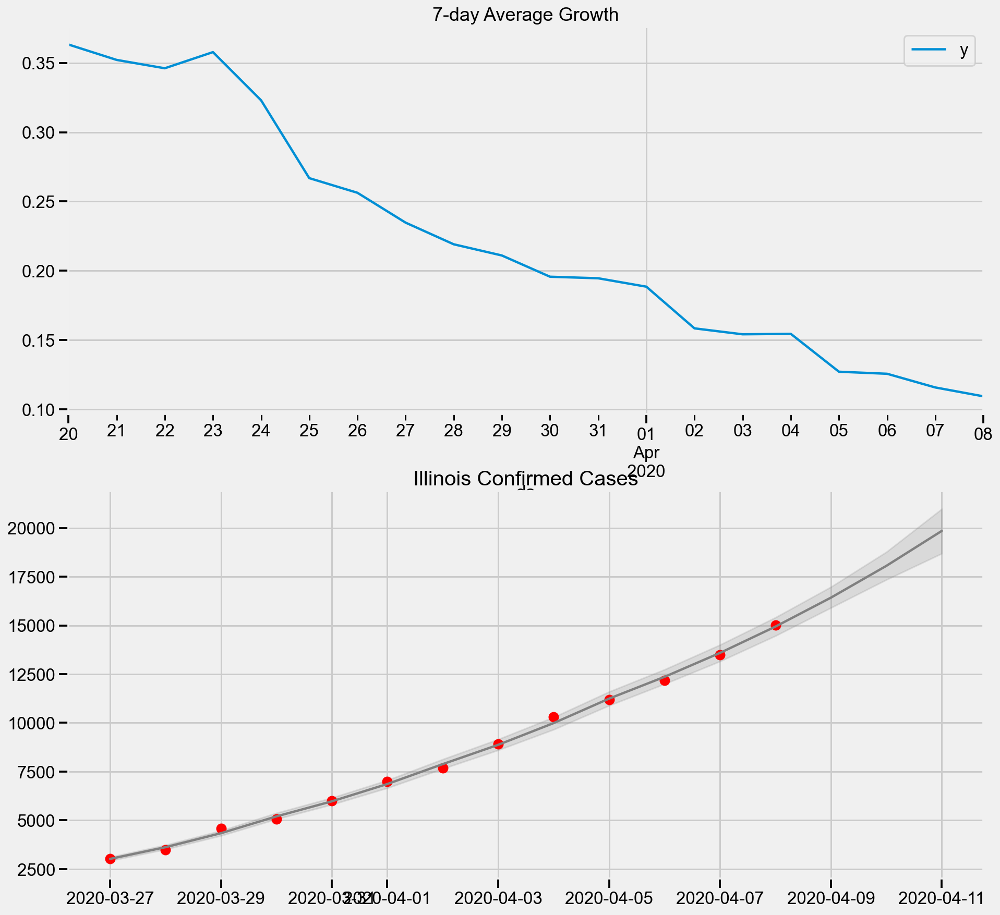

In [13]:
latest_date = new_cases.ds.max()
earliest_date = latest_date - datetime.timedelta(days=12) # predict based on latest 2 weeks

all_cases = pd.concat([hist_cases, new_cases], ignore_index=True)
modeled_cases = all_cases.query(f"ds >= '{earliest_date}'") #" and ds <'{latest_date}'")

ts = modeled_cases.copy()
ts['y'] = np.log1p(ts['y'])
#ts['cap'] = 400000
#ts['floor'] = 0

m = Prophet(yearly_seasonality=False, 
            daily_seasonality=False, 
            n_changepoints=3,
            weekly_seasonality=False, 
            growth='linear',)
            #seasonality_mode='multiplicative',
#     ).add_seasonality(
#         name="weekly",
#         period=7,
#         fourier_order=20,
#     )
m.fit(ts);

# project next 3 days                     
future = m.make_future_dataframe(3)
#future['cap'] = 40000
#future['floor'] = np.expm1(8.157943507105037)
forecast = m.predict(future)
#m.plot(forecast);
forecast2 = forecast[['yhat_lower', 'yhat', 'yhat_upper']].apply(np.expm1)
forecast2['ds'] = forecast['ds']

fig, axs = plt.subplots(2,1, figsize=(14,14))

shift=7
growth = all_cases.set_index('ds')
growth = (np.log(growth / growth.shift(shift)) / shift).tail(20)
growth.plot(ax=axs[0], title=f'{shift}-day Average Growth');

# projected confirmed cases
sns.set_style('whitegrid')

plt.plot(modeled_cases.ds.values, modeled_cases.y, 'or')
plt.plot(forecast2.ds.values, forecast2.yhat.values, color='gray');
plt.fill_between(forecast2.ds.values, 
                 forecast2.yhat_lower.values, 
                 forecast2.yhat_upper.values, 
                 color='gray', alpha=0.2);
plt.title('Illinois Confirmed Cases', {'fontsize': 20});

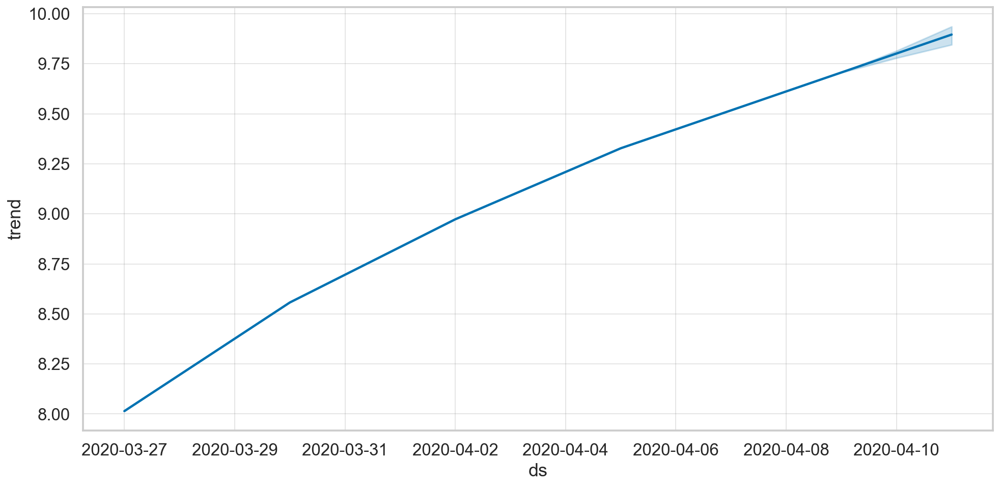

In [14]:
# forecast trends
m.plot_components(forecast, figsize=(14,7));

In [15]:
# magic number for tomorrow
int(all_cases.loc[all_cases.ds == (latest_date - datetime.timedelta(days=6)),'y'].values[0] * np.exp(growth.loc[growth.index.max(),'y'] * 7) - all_cases.loc[all_cases.ds == latest_date,'y'].values[0])

1537

In [16]:
# daily new cases next 3 days
forecast.tail()[['ds','yhat']].set_index('ds').apply(lambda x: round(np.expm1(x))).diff().iloc[-3:]

,yhat
ds,
2020-04-09,1484.0
2020-04-10,1631.0
2020-04-11,1793.0


## Death Projections

In [17]:
new_deaths = (
    summary_df
    .groupby('date')
    .agg({'deaths': 'sum'})
    .reset_index())

new_deaths.columns = ['ds','y']
new_deaths['y'] = new_deaths['y'].astype(np.float64)

INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


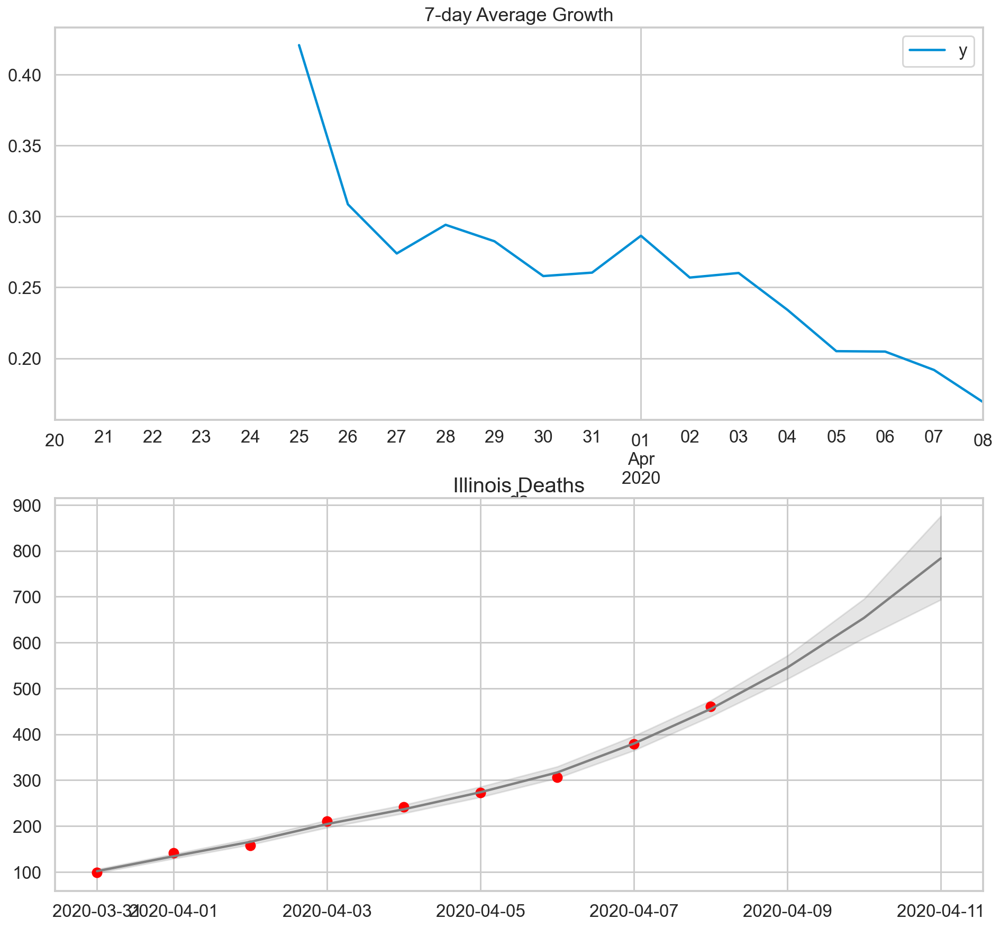

In [18]:
latest_date = new_deaths.ds.max()
earliest_date = latest_date - datetime.timedelta(days=8) # predict based on latest 2 weeks

all_deaths = new_deaths.copy()
modeled_deaths = all_deaths.query(f"ds >= '{earliest_date}'") #" and ds <'{latest_date}'")

deaths_ts = modeled_deaths.copy()
deaths_ts['y'] = np.log1p(deaths_ts['y'])
#ts['cap'] = 2360
#ts['floor'] = 0

deaths_m = Prophet(yearly_seasonality=False, 
            daily_seasonality=False, 
            weekly_seasonality=False, 
            growth='linear',)
deaths_m.fit(deaths_ts);

# project next 3 days                     
deaths_future = deaths_m.make_future_dataframe(3)
#future['cap'] = 2360
#future['floor'] = 0
deaths_forecast = deaths_m.predict(deaths_future)
#deaths_m.plot(deaths_forecast);

deaths_forecast2 = deaths_forecast[['yhat_lower', 'yhat', 'yhat_upper']].apply(np.expm1)
deaths_forecast2['ds'] = deaths_forecast['ds']

fig, axs = plt.subplots(2,1, figsize=(14,14))

shift=7
deaths_growth = all_deaths.set_index('ds')
deaths_growth = (np.log(deaths_growth / deaths_growth.shift(shift)) / shift).tail(20)
deaths_growth.plot(ax=axs[0], title=f'{shift}-day Average Growth');

# projected confirmed cases
sns.set_style('whitegrid')

plt.plot(modeled_deaths.ds.values, modeled_deaths.y, 'or')
plt.plot(deaths_forecast2.ds.values, deaths_forecast2.yhat.values, color='gray');
plt.fill_between(deaths_forecast2.ds.values, 
                 deaths_forecast2.yhat_lower.values, 
                 deaths_forecast2.yhat_upper.values, 
                 color='gray', alpha=0.2);
plt.title('Illinois Deaths', {'fontsize': 20});

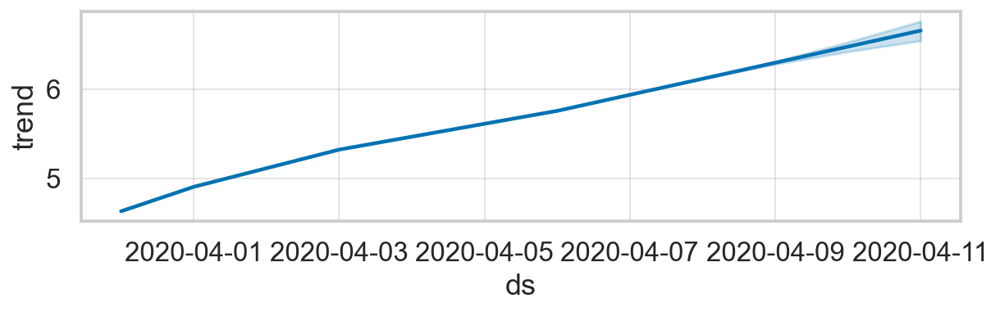

In [19]:
deaths_m.plot_components(deaths_forecast);

Magic Number of Deaths for tomorrow to reduce growth rate

In [20]:
int(all_deaths.loc[all_deaths.ds == (latest_date - datetime.timedelta(days=6)),'y'].values[0] 
    * np.exp(deaths_growth.loc[deaths_growth.index.max(),'y'] * 7) 
    - all_deaths.loc[all_deaths.ds == latest_date,'y'].values[0])

52

In [23]:
# daily new cases next 3 days
deaths_forecast.tail()[['ds','yhat','yhat_lower','yhat_upper']].set_index('ds').apply(lambda x: round(np.expm1(x))).diff().iloc[-3:]

,yhat,yhat_lower,yhat_upper
ds,,,
2020-04-09,90.0,81.0,98.0
2020-04-10,109.0,90.0,124.0
2020-04-11,129.0,83.0,181.0


INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


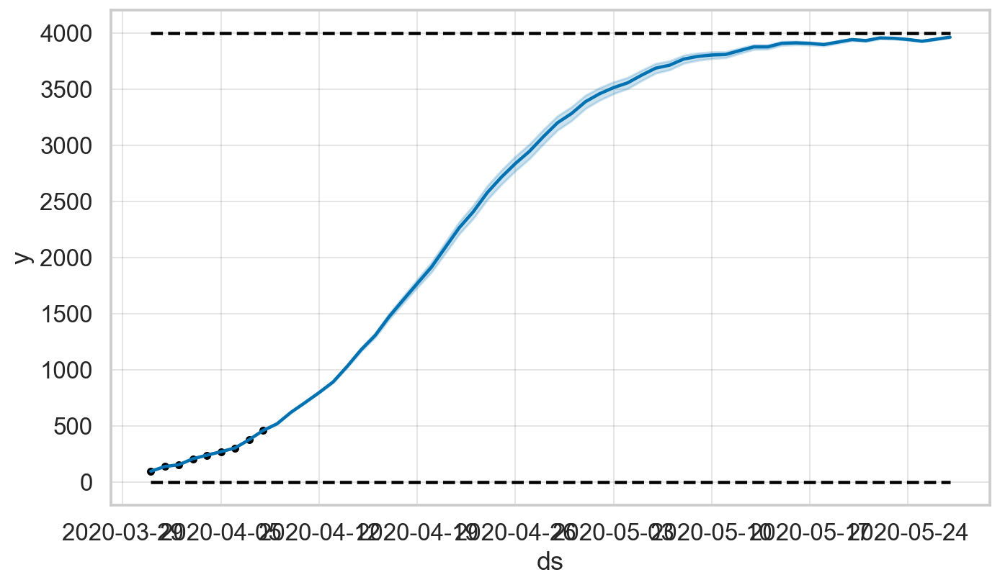

In [24]:
latest_date = new_deaths.ds.max()
earliest_date = latest_date - datetime.timedelta(days=8) # predict based on latest 2 weeks

all_deaths = new_deaths.copy()
modeled_deaths = all_deaths.query(f"ds >= '{earliest_date}'") #" and ds <'{latest_date}'")

deaths_ts = modeled_deaths.copy()
#deaths_ts['y'] = np.log1p(deaths_ts['y'])
deaths_ts['cap'] = 4000
deaths_ts['floor'] = 0

deaths_m = Prophet(yearly_seasonality=False, 
            daily_seasonality=False, 
            weekly_seasonality=False, 
            growth='logistic',
            ).add_seasonality(
                name="weekly",
                period=7,
                fourier_order=20,)
deaths_m.fit(deaths_ts);

# project next days                     
deaths_future = deaths_m.make_future_dataframe(49)
deaths_future['cap'] = 4000
deaths_future['floor'] = 0
deaths_forecast = deaths_m.predict(deaths_future)
deaths_m.plot(deaths_forecast);

# State Overview

In [25]:
import json

In [26]:
counties = json.load(open('../data/Illinois_County_Geo_ch.json','rb'))

In [27]:
map_df = il_df.copy().query('date == date.max()')
map_df.loc[map_df['county'] == "Suburban Cook", 'county'] = 'Cook'
map_df['color'] = np.log1p(map_df['deaths'])

In [28]:
import plotly.express as px

In [29]:
map_df.head()

,index,county,confirmed_cases,total_tested,negative,deaths,date,pop,color
1020,1024,Illinois,15078.0,75066,0,462.0,2020-04-08,14316487,6.137727
1021,1025,Adams,1.0,0,0,0.0,2020-04-08,76273,0.000000
1022,1026,Alexander,0.0,0,0,0.0,2020-04-08,9933,0.000000
1023,1027,Bond,3.0,0,0,0.0,2020-04-08,19154,0.000000
1024,1028,Boone,7.0,0,0,1.0,2020-04-08,48540,0.693147


In [30]:
import plotly.graph_objects as go

token = 'pk.eyJ1Ijoia2Jvbm92aWNoIiwiYSI6ImNrMm05YmdwOTBmbHozaHBoaGdtNWQyY3IifQ.hX16cd6AxvUMsfWt25bVUw'

fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=map_df.county, z=map_df.confirmed_cases,
                                    showscale=False,
                                    colorscale=[[0, 'rgb(255,255,255)'], [.1, 'rgb(154,168,193)'], [1, 'rgb(108,128,164)']], 
                                    zmin=0, zmax=50, marker_line_width=1))
fig.update_layout(mapbox_style="light", mapbox_accesstoken=token,
                  mapbox_zoom=5.1, mapbox_center = {"lat": 39.855948, "lon": -89.058383})
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0}, height=560, width=280,hovermode='closest')
fig.show()